In [124]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

import seaborn as sns

import numpy as np
import pandas as pd

from statsmodels.nonparametric.smoothers_lowess import lowess

In [61]:
font_path = "/Users/anvi/Desktop/climate_science/utils/fonts/Work_Sans/static/WorkSans-Regular.ttf"
fm.fontManager.addfont(font_path)
plt.rcParams["font.family"] = "Work Sans"
work_sans_title = fm.FontProperties(fname="/Users/anvi/Desktop/climate_science/utils/fonts/Work_Sans/static/WorkSans-Bold.ttf", size=16)
work_sans_axis = fm.FontProperties(fname="/Users/anvi/Desktop/climate_science/utils/fonts/Work_Sans/static/WorkSans-Regular.ttf", size=12)

In [96]:
glob_df = pd.read_csv("/Users/anvi/Desktop/climate_science/GISS_Surface_Temperature_Analysis_v4/data/L_OTI/global/global_mean.csv", skiprows=1)
north_df = pd.read_csv("/Users/anvi/Desktop/climate_science/GISS_Surface_Temperature_Analysis_v4/data/L_OTI/global/northern_mean.csv", skiprows=1)
south_df = pd.read_csv("/Users/anvi/Desktop/climate_science/GISS_Surface_Temperature_Analysis_v4/data/L_OTI/global/southern_mean.csv", skiprows=1)

In [97]:
print(f"Number of columns in glob_df: {glob_df.shape[1]}")
print(f"Number of rows in glob_df: {glob_df.shape[0]}")
print(f"Number of columns in north_df: {north_df.shape[1]}")
print(f"Number of rows in north_df: {north_df.shape[0]}")
print(f"Number of columns in south_df: {south_df.shape[1]}")
print(f"Number of rows in south_df: {south_df.shape[0]}")

Number of columns in glob_df: 19
Number of rows in glob_df: 147
Number of columns in north_df: 19
Number of rows in north_df: 147
Number of columns in south_df: 19
Number of rows in south_df: 147


In [98]:
glob_df

,Year,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,J-D,D-N,DJF,MAM,JJA,SON
0,1880,-0.19,-0.26,-0.10,-0.17,-0.11,-0.22,-0.19,-0.11,-.15,-.24,-.23,-.18,-.18,***,***,-0.13,-0.17,-.21
1,1881,-0.20,-0.15,0.03,0.05,0.05,-0.19,0.00,-0.04,-.16,-.22,-.19,-.08,-.09,-.10,-.18,0.04,-0.08,-.19
2,1882,0.16,0.13,0.04,-0.16,-0.14,-0.23,-0.17,-0.08,-.15,-.24,-.17,-.37,-.12,-.09,.07,-0.09,-0.16,-.19
3,1883,-0.30,-0.37,-0.13,-0.19,-0.18,-0.07,-0.08,-0.14,-.22,-.11,-.25,-.12,-.18,-.20,-.34,-0.16,-0.10,-.19
4,1884,-0.13,-0.08,-0.36,-0.40,-0.34,-0.35,-0.31,-0.28,-.27,-.25,-.34,-.31,-.29,-.27,-.11,-0.37,-0.31,-.29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142,2022,0.91,0.89,1.05,0.83,0.84,0.93,0.94,0.94,.88,.97,.73,.80,.89,.90,.90,0.91,0.94,.86
143,2023,0.88,0.97,1.23,0.99,0.94,1.09,1.19,1.19,1.48,1.35,1.40,1.36,1.17,1.12,.88,1.05,1.16,1.41
144,2024,1.25,1.44,1.40,1.32,1.16,1.23,1.20,1.30,1.21,1.35,1.30,1.27,1.29,1.29,1.35,1.29,1.25,1.29
145,2025,1.38,1.26,1.37,1.25,1.08,1.07,1.02,1.18,1.25,1.19,1.21,1.06,1.19,1.21,1.30,1.23,1.09,1.22


In [99]:
north_df

,Year,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,J-D,D-N,DJF,MAM,JJA,SON
0,1880,-0.37,-0.52,-0.24,-0.31,-0.07,-0.17,-0.20,-0.28,-.25,-.33,-.44,-.41,-.30,***,***,-0.21,-0.21,-.34
1,1881,-0.31,-0.23,-0.04,0.00,0.03,-0.34,0.07,-0.05,-.27,-.44,-.37,-.24,-.18,-.20,-.32,-0.01,-0.11,-.36
2,1882,0.26,0.20,0.02,-0.30,-0.24,-0.29,-0.28,-0.17,-.26,-.52,-.34,-.69,-.22,-.18,.07,-0.18,-0.25,-.38
3,1883,-0.58,-0.66,-0.16,-0.30,-0.25,-0.11,-0.06,-0.23,-.34,-.16,-.45,-.15,-.29,-.33,-.64,-0.23,-0.14,-.32
4,1884,-0.17,-0.11,-0.64,-0.58,-0.36,-0.42,-0.41,-0.52,-.45,-.45,-.58,-.47,-.43,-.40,-.14,-0.53,-0.45,-.49
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142,2022,1.24,1.16,1.41,1.09,1.03,1.13,1.07,1.17,1.15,1.32,1.10,1.07,1.16,1.17,1.19,1.18,1.12,1.19
143,2023,1.29,1.28,1.64,1.01,1.13,1.20,1.45,1.57,1.68,1.88,1.96,1.85,1.50,1.43,1.21,1.26,1.41,1.84
144,2024,1.67,1.93,1.78,1.79,1.45,1.54,1.42,1.43,1.56,1.75,1.89,1.71,1.66,1.67,1.82,1.67,1.46,1.73
145,2025,1.85,1.63,1.84,1.60,1.22,1.20,1.23,1.29,1.41,1.49,1.68,1.42,1.49,1.51,1.73,1.56,1.24,1.53


In [100]:
south_df

,Year,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,J-D,D-N,DJF,MAM,JJA,SON
0,1880,-0.01,0.02,0.05,-0.03,-0.14,-0.26,-0.18,0.06,-.06,-.16,-.02,.04,-.06,***,***,-0.04,-0.13,-.08
1,1881,-0.10,-0.07,0.08,0.08,0.08,-0.06,-0.09,-0.03,-.05,-.02,-.02,.08,-.01,-.01,-.04,0.08,-0.06,-.03
2,1882,0.06,0.06,0.06,-0.03,-0.05,-0.16,-0.05,0.00,-.05,.03,-.02,-.08,-.02,-.01,.07,-0.01,-0.07,-.02
3,1883,-0.03,-0.09,-0.10,-0.08,-0.11,-0.03,-0.09,-0.06,-.11,-.06,-.05,-.07,-.07,-.07,-.07,-0.10,-0.06,-.08
4,1884,-0.09,-0.06,-0.11,-0.22,-0.32,-0.30,-0.22,-0.07,-.11,-.07,-.11,-.16,-.16,-.15,-.08,-0.22,-0.20,-.10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142,2022,0.58,0.61,0.67,0.57,0.65,0.71,0.81,0.71,.61,.62,.37,.53,.62,.62,.59,0.63,0.74,.53
143,2023,0.45,0.64,0.81,0.96,0.75,0.98,0.95,0.83,1.29,.83,.85,.87,.85,.82,.54,0.84,0.92,.99
144,2024,0.83,0.94,1.01,0.84,0.88,0.94,0.99,1.17,.87,.96,.71,.83,.91,.92,.88,0.91,1.03,.85
145,2025,0.90,0.88,0.89,0.88,0.94,0.93,0.82,1.05,1.09,.89,.74,.69,.89,.90,.87,0.90,0.93,.91


---

J-D : calendar year average; from the first day of January to the last day of December

D-N : meteorological year average; from the first day of December to the last day of November

In [101]:
glob_df.rename(columns={'Jan':'January', 'Feb':'February', 'Mar':'March', 'Apr':'April', 'May':'May', 'Jun':'June', 'Jul':'July', 'Aug':'August', 'Sep':'September', 'Oct':'October', 'Nov':'November', 'Dec':'December'}, inplace=True)
north_df.rename(columns={'Jan':'January', 'Feb':'February', 'Mar':'March', 'Apr':'April', 'May':'May', 'Jun':'June', 'Jul':'July', 'Aug':'August', 'Sep':'September', 'Oct':'October', 'Nov':'November', 'Dec':'December'}, inplace=True)
south_df.rename(columns={'Jan':'January', 'Feb':'February', 'Mar':'March', 'Apr':'April', 'May':'May', 'Jun':'June', 'Jul':'July', 'Aug':'August', 'Sep':'September', 'Oct':'October', 'Nov':'November', 'Dec':'December'}, inplace=True)

In [102]:
temp_columns_g = glob_df.columns.drop('Year')
temp_columns_n = north_df.columns.drop('Year')
temp_columns_s = south_df.columns.drop('Year')

In [103]:
glob_df[temp_columns_g] = glob_df[temp_columns_g].apply(pd.to_numeric, errors='coerce') * 0.01
north_df[temp_columns_n] = north_df[temp_columns_n].apply(pd.to_numeric, errors='coerce') * 0.01
south_df[temp_columns_s] = south_df[temp_columns_s].apply(pd.to_numeric, errors='coerce') * 0.01

Global Temperature Anomaly

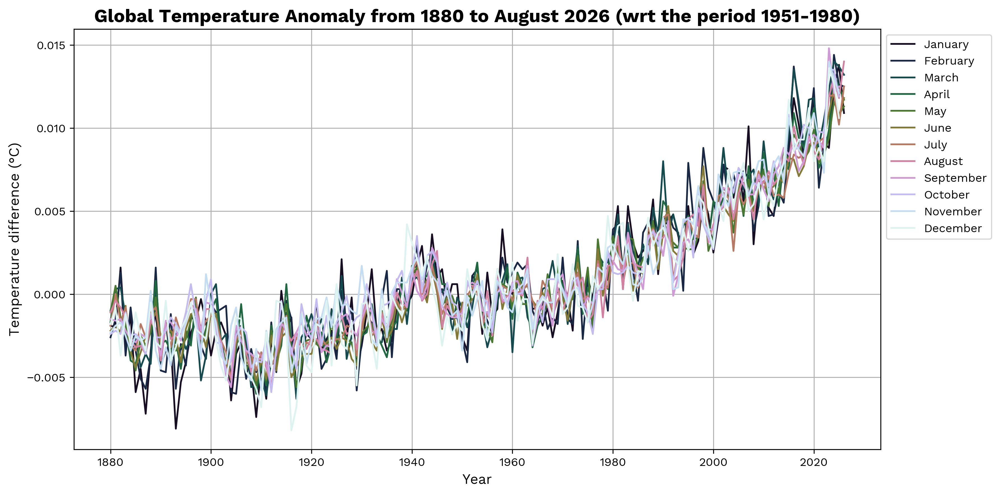

In [104]:
plt.figure(figsize=(12, 6), dpi=300)

monthly_columns = temp_columns_g[:12]

#defining the color palette for the plot using seaborn's palette
colors = sns.color_palette("cubehelix", n_colors=len(monthly_columns))

#plotting the temperature data for each month
for col in monthly_columns:
    plt.plot(glob_df['Year'], glob_df[col], label=col, color=colors.pop(0))

#plot parameters
plt.xlabel('Year', fontproperties=work_sans_axis)
plt.ylabel('Temperature difference (°C)', fontproperties=work_sans_axis)
plt.title('Global Temperature Anomaly from 1880 to August 2026 (wrt the period 1951-1980)', fontproperties=work_sans_title)
plt.legend(loc='best', bbox_to_anchor=(1, 1))
plt.grid()
plt.tight_layout()
plt.savefig('/Users/anvi/Desktop/climate_science/notebook/GISS/out/plots/Global_Temperature_Anomaly_1880-2026.png', dpi=1000, bbox_inches='tight')
plt.show()

Northern Temperature Anomaly

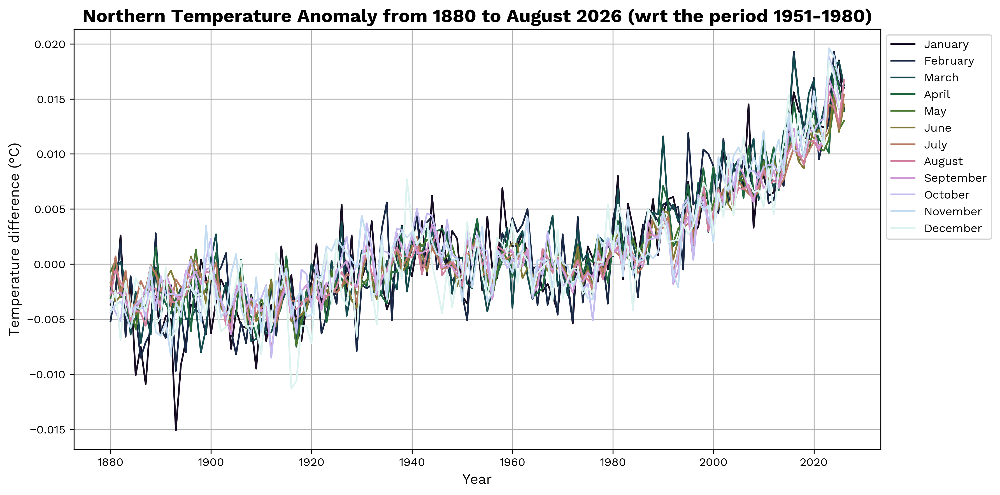

In [105]:
plt.figure(figsize=(12, 6), dpi=300)

monthly_columns = temp_columns_n[:12]

#defining the color palette for the plot using seaborn's palette
colors = sns.color_palette("cubehelix", n_colors=len(monthly_columns))

#plotting the temperature data for each month
for col in monthly_columns:
    plt.plot(north_df['Year'], north_df[col], label=col, color=colors.pop(0))

#plot parameters
plt.xlabel('Year', fontproperties=work_sans_axis)
plt.ylabel('Temperature difference (°C)', fontproperties=work_sans_axis)
plt.title('Northern Temperature Anomaly from 1880 to August 2026 (wrt the period 1951-1980)', fontproperties=work_sans_title)
plt.legend(loc='best', bbox_to_anchor=(1, 1))
plt.grid()
plt.tight_layout()
plt.savefig('/Users/anvi/Desktop/climate_science/notebook/GISS/out/plots/Northern_Temperature_Anomaly_1880-2026.png', dpi=1000, bbox_inches='tight')
plt.show()

Southern Temperature Anomaly

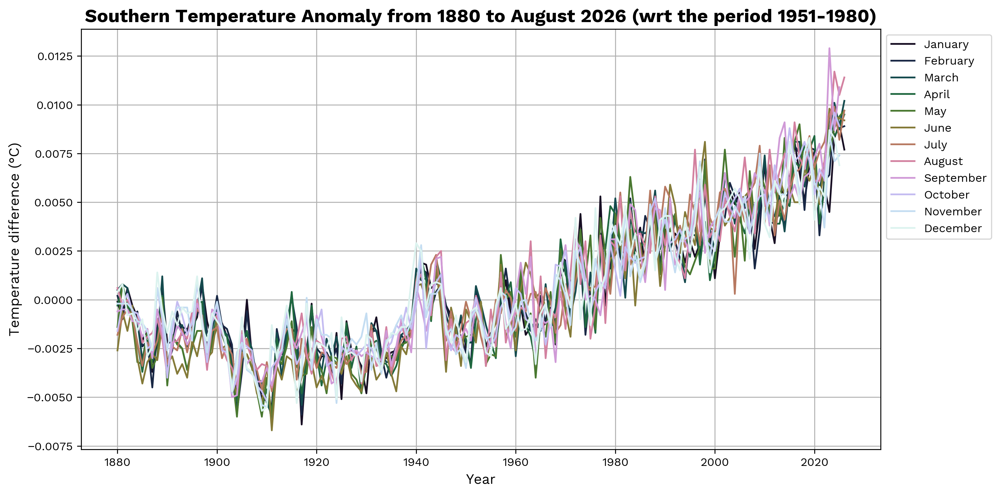

In [106]:
plt.figure(figsize=(12, 6), dpi=300)

monthly_columns = temp_columns_s[:12]

#defining the color palette for the plot using seaborn's palette
colors = sns.color_palette("cubehelix", n_colors=len(monthly_columns))

#plotting the temperature data for each month
for col in monthly_columns:
    plt.plot(south_df['Year'], south_df[col], label=col, color=colors.pop(0))

#plot parameters
plt.xlabel('Year', fontproperties=work_sans_axis)
plt.ylabel('Temperature difference (°C)', fontproperties=work_sans_axis)
plt.title('Southern Temperature Anomaly from 1880 to August 2026 (wrt the period 1951-1980)', fontproperties=work_sans_title)
plt.legend(loc='best', bbox_to_anchor=(1, 1))
plt.grid()
plt.tight_layout()
plt.savefig('/Users/anvi/Desktop/climate_science/notebook/GISS/out/plots/Southern_Temperature_Anomaly_1880-2026.png', dpi=1000, bbox_inches='tight')
plt.show()

In [107]:
plt.figure(figsize=(12, 6), dpi=1000)

#defining the color palette for the plot using seaborn's palette
colors = sns.color_palette("magma", n_colors=len(temp_columns_g[12:14]))

#plotting the temperature data for each month
for col in temp_columns_g[12:14]:
    plt.plot(glob_df['Year'], glob_df[col], label=col, color=colors.pop(0))

#plot parameters
plt.xlabel('Year', fontproperties=work_sans_axis)
plt.ylabel('Temperature difference (°C)', fontproperties=work_sans_axis)
plt.title('Global Temperature Anomaly from 1880 to August 2026 (wrt the period 1951-1980)', fontproperties=work_sans_title)
plt.legend(loc='best', bbox_to_anchor=(1, 1))
plt.grid()
plt.tight_layout()
plt.show()

In [108]:
plt.figure(figsize=(12, 6), dpi=1000)

#defining the color palette for the plot using seaborn's palette
colors = sns.color_palette("magma", n_colors=len(temp_columns_g[14:17:2]))

#plotting the temperature data for each month
for col in temp_columns_g[14:17:2]:
    plt.plot(glob_df['Year'], glob_df[col], label=col, color=colors.pop(0))

#plot parameters
plt.xlabel('Year', fontproperties=work_sans_axis)
plt.ylabel('Temperature difference (°C)', fontproperties=work_sans_axis)
plt.title('Global Temperature Anomaly from 1880 to August 2026 (wrt the period 1951-1980)', fontproperties=work_sans_title)
plt.legend(loc='best', bbox_to_anchor=(1, 1))
plt.grid()
plt.tight_layout()
plt.show()

Global

In [109]:
# transforming the months into rows; and inverting to have January at the top and December at the bottom
glob_heatmap_data = glob_df.set_index("Year")[monthly_columns].T.iloc[::-1]

In [110]:
plt.figure(figsize=(14, 6), dpi=1000)

ax = sns.heatmap(
        glob_heatmap_data,
        cmap="RdYlBu_r",
        center=0,
        linewidths=0.1,
        xticklabels=4,
        cbar_kws={"label": "Temperature difference (°C)"}
)

ax.set_xticklabels(ax.get_xticklabels(), rotation=45)

plt.xlabel("Year", fontproperties=work_sans_axis)
plt.ylabel("Month", fontproperties=work_sans_axis)
plt.title(
    "Monthly Global Temperature Anomalies",
    fontproperties=work_sans_title
)
plt.tight_layout()
plt.savefig('/Users/anvi/Desktop/climate_science/notebook/GISS/out/heatmaps/Monthly_Global_Temperature_Anomalies.png', dpi=500, bbox_inches='tight')
plt.show()

North

In [111]:
# transforming the months into rows; and inverting to have January at the top and December at the bottom
north_heatmap_data = north_df.set_index("Year")[monthly_columns].T.iloc[::-1]

In [112]:
plt.figure(figsize=(14, 6), dpi=1000)

ax = sns.heatmap(
        north_heatmap_data,
        cmap="RdYlBu_r",
        center=0,
        linewidths=0.1,
        xticklabels=4,
        cbar_kws={"label": "Temperature difference (°C)"}
)

ax.set_xticklabels(ax.get_xticklabels(), rotation=45)

plt.xlabel("Year", fontproperties=work_sans_axis)
plt.ylabel("Month", fontproperties=work_sans_axis)
plt.title(
    "Monthly Northern Hemisphere Temperature Anomalies",
    fontproperties=work_sans_title
)
plt.tight_layout()
plt.savefig('/Users/anvi/Desktop/climate_science/notebook/GISS/out/heatmaps/Monthly_Northern_Temperature_Anomalies.png', dpi=1000, bbox_inches='tight')
plt.show()

South

In [113]:
# transforming the months into rows; and inverting to have January at the top and December at the bottom
south_heatmap_data = south_df.set_index("Year")[monthly_columns].T.iloc[::-1]

In [114]:
plt.figure(figsize=(14, 6), dpi=1000)

ax = sns.heatmap(
        south_heatmap_data,
        cmap="RdYlBu_r",
        center=0,
        linewidths=0.1,
        xticklabels=4,
        cbar_kws={"label": "Temperature difference (°C)"}
)

ax.set_xticklabels(ax.get_xticklabels(), rotation=45)

plt.xlabel("Year", fontproperties=work_sans_axis)
plt.ylabel("Month", fontproperties=work_sans_axis)
plt.title(
    "Monthly Southern Hemisphere Temperature Anomalies",
    fontproperties=work_sans_title
)
plt.tight_layout()
plt.savefig('/Users/anvi/Desktop/climate_science/notebook/GISS/out/heatmaps/Monthly_Southern_Temperature_Anomalies.png', dpi=1000, bbox_inches='tight')
plt.show()

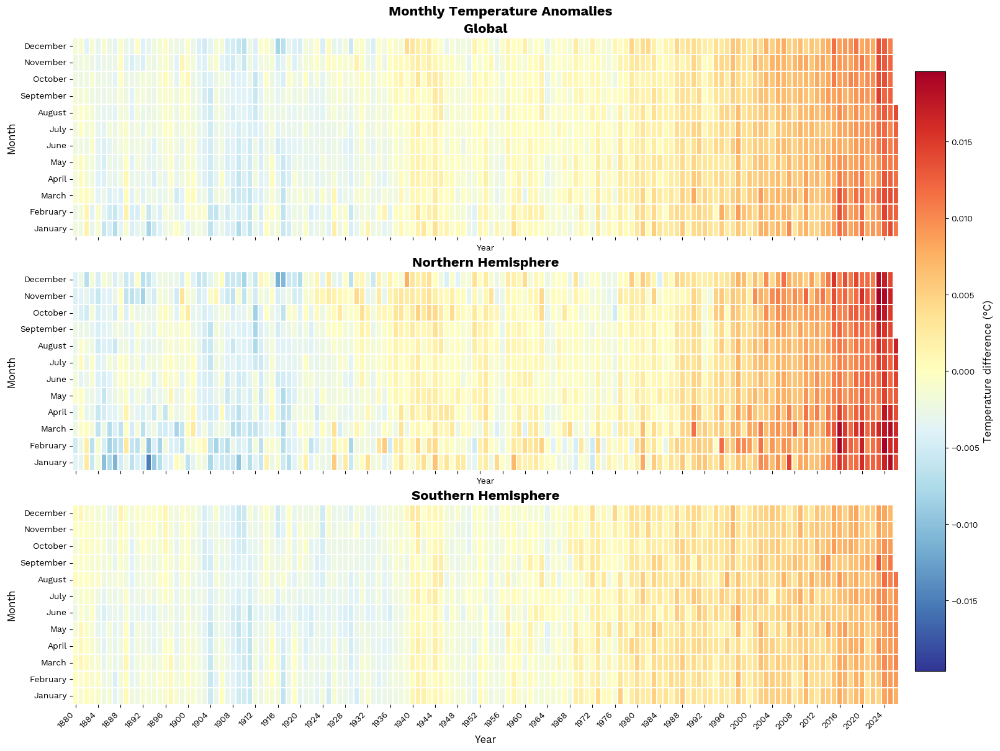

In [129]:
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

monthly_columns = temp_columns_g[:12]

heatmaps = {"Global": glob_heatmap_data, "Northern Hemisphere": north_heatmap_data, "Southern Hemisphere": south_heatmap_data,}

# Same color limits for all heatmaps
combined_values = pd.concat(heatmaps.values()).to_numpy()
limit = np.nanmax(np.abs(combined_values))
norm = Normalize(vmin=-limit, vmax=limit)
cmap = "RdYlBu_r"

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(16, 12), sharex=True, constrained_layout=True)

for ax, (title, data) in zip(axes, heatmaps.items()):
    sns.heatmap(data, ax=ax, cmap=cmap, vmin=-limit, vmax=limit,center=0, linewidths=0.1, xticklabels=4, cbar=False) 

    ax.set_title(title, fontproperties=work_sans_title)
    ax.set_ylabel("Month", fontproperties=work_sans_axis)
    ax.set_yticklabels(data.index, rotation=0)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

axes[-1].set_xlabel("Year", fontproperties=work_sans_axis)

# One shared colorbar
sm = ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
colorbar = fig.colorbar(sm, ax=axes, location="right", shrink=0.9, pad=0.02)
colorbar.set_label("Temperature difference (°C)", fontproperties=work_sans_axis)

fig.suptitle("Monthly Temperature Anomalies", fontproperties=work_sans_title)
plt.savefig("/Users/anvi/Desktop/climate_science/notebook/GISS/out/heatmaps/Monthly_Global_Northern_Southern_Temperature_Anomalies.png", 
            dpi=500, bbox_inches="tight")

plt.show()

In [115]:
#i want the mean temperature anomaly for each year
glob_annual_mean = glob_df[monthly_columns].mean(axis=1)
north_annual_mean = north_df[monthly_columns].mean(axis=1)
south_annual_mean = south_df[monthly_columns].mean(axis=1)

In [130]:
plt.figure(figsize=(12, 6), dpi=1000)

#plotting the temperature data for each month
plt.plot(glob_df['Year'], glob_annual_mean, color='navy', marker='o', markersize=3)
plt.plot(north_df['Year'], north_annual_mean, color='forestgreen', marker='s', markersize=3)
plt.plot(south_df['Year'], south_annual_mean, color='orange', marker='^', markersize=3)

#plot parameters
plt.xlabel('Year', fontproperties=work_sans_axis)
plt.ylabel('Temperature difference (°C)', fontproperties=work_sans_axis)
plt.title('Annual Mean - Temperature Anomaly 1880-2026 (wrt 1951-1980)', fontproperties=work_sans_title)
plt.grid()
plt.legend(['Global', 'Northern Hemisphere', 'Southern Hemisphere'], loc='best', bbox_to_anchor=(1, 1))
plt.savefig('/Users/anvi/Desktop/climate_science/notebook/GISS/out/plots/Annual_Mean_Temperature_Anomaly_1880-2026.png', dpi=1000, bbox_inches='tight')
plt.tight_layout()
plt.show()

In [131]:
plt.figure(figsize=(12, 6), dpi=1000)

#plotting the temperature data for each month
plt.plot(glob_df['Year'], glob_annual_mean, color='navy', marker='o', markersize=3)
plt.plot(north_df['Year'], north_annual_mean, color='forestgreen', marker='s', markersize=3)
plt.plot(south_df['Year'], south_annual_mean, color='orange', marker='^', markersize=3)

#lowess smoothing
glob_lowess_smoothed_01 = lowess(glob_annual_mean, glob_df['Year'], frac=0.1, delta = 0.01*len(glob_df['Year']))
north_lowess_smoothed_01 = lowess(north_annual_mean, north_df['Year'], frac=0.1, delta = 0.01*len(north_df['Year']))
south_lowess_smoothed_01 = lowess(south_annual_mean, south_df['Year'], frac=0.1, delta = 0.01*len(south_df['Year']))

#plot the lowess smoothed line
plt.plot(glob_lowess_smoothed_01[:, 0], glob_lowess_smoothed_01[:, 1], color='blue', label='Lowess Smoothed (frac=0.1)', linewidth=2)
plt.plot(north_lowess_smoothed_01[:, 0], north_lowess_smoothed_01[:, 1], color='limegreen', label='Lowess Smoothed (frac=0.1)', linewidth=2)
plt.plot(south_lowess_smoothed_01[:, 0], south_lowess_smoothed_01[:, 1], color='darkorange', label='Lowess Smoothed (frac=0.1)', linewidth=2)

#plot parameters
plt.xlabel('Year', fontproperties=work_sans_axis)
plt.ylabel('Temperature difference (°C)', fontproperties=work_sans_axis)
plt.title('Annual Mean - Temperature Anomaly 1880-2026 (wrt 1951-1980)', fontproperties=work_sans_title)
plt.legend(loc='best', bbox_to_anchor=(1, 1))
plt.grid()
plt.tight_layout()
plt.savefig('/Users/anvi/Desktop/climate_science/notebook/GISS/out/plots/Annual_Mean_Temperature_Anomaly_1880-2026_with_trend.png', dpi=1000, bbox_inches='tight')
plt.show()